### Problem Statement

Data Set Information:

This data is for the purpose of bias correction of next-day maximum and minimum air temperatures forecast of the LDAPS model operated by the Korea Meteorological Administration over Seoul, South Korea. This data consists of summer data from 2013 to 2017. The input data is largely composed of the LDAPS model's next-day forecast data, in-situ maximum and minimum temperatures of present-day, and geographic auxiliary variables. There are two outputs (i.e. next-day maximum and minimum air temperatures) in this data. Hindcast validation was conducted for the period from 2015 to 2017.


Attribute Information:

For more information, read [Cho et al, 2020].
1. station - used weather station number: 1 to 25
2. Date - Present day: yyyy-mm-dd ('2013-06-30' to '2017-08-30')
3. Present_Tmax - Maximum air temperature between 0 and 21 h on the present day (Â°C): 20 to 37.6
4. Present_Tmin - Minimum air temperature between 0 and 21 h on the present day (Â°C): 11.3 to 29.9
5. LDAPS_RHmin - LDAPS model forecast of next-day minimum relative humidity (%): 19.8 to 98.5
6. LDAPS_RHmax - LDAPS model forecast of next-day maximum relative humidity (%): 58.9 to 100
7. LDAPS_Tmax_lapse - LDAPS model forecast of next-day maximum air temperature applied lapse rate (Â°C): 17.6 to 38.5
8. LDAPS_Tmin_lapse - LDAPS model forecast of next-day minimum air temperature applied lapse rate (Â°C): 14.3 to 29.6
9. LDAPS_WS - LDAPS model forecast of next-day average wind speed (m/s): 2.9 to 21.9
10. LDAPS_LH - LDAPS model forecast of next-day average latent heat flux (W/m2): -13.6 to 213.4
11. LDAPS_CC1 - LDAPS model forecast of next-day 1st 6-hour split average cloud cover (0-5 h) (%): 0 to 0.97
12. LDAPS_CC2 - LDAPS model forecast of next-day 2nd 6-hour split average cloud cover (6-11 h) (%): 0 to 0.97
13. LDAPS_CC3 - LDAPS model forecast of next-day 3rd 6-hour split average cloud cover (12-17 h) (%): 0 to 0.98
14. LDAPS_CC4 - LDAPS model forecast of next-day 4th 6-hour split average cloud cover (18-23 h) (%): 0 to 0.97
15. LDAPS_PPT1 - LDAPS model forecast of next-day 1st 6-hour split average precipitation (0-5 h) (%): 0 to 23.7
16. LDAPS_PPT2 - LDAPS model forecast of next-day 2nd 6-hour split average precipitation (6-11 h) (%): 0 to 21.6
17. LDAPS_PPT3 - LDAPS model forecast of next-day 3rd 6-hour split average precipitation (12-17 h) (%): 0 to 15.8
18. LDAPS_PPT4 - LDAPS model forecast of next-day 4th 6-hour split average precipitation (18-23 h) (%): 0 to 16.7
19. lat - Latitude (Â°): 37.456 to 37.645
20. lon - Longitude (Â°): 126.826 to 127.135
21. DEM - Elevation (m): 12.4 to 212.3
22. Slope - Slope (Â°): 0.1 to 5.2
23. Solar radiation - Daily incoming solar radiation (wh/m2): 4329.5 to 5992.9
24. Next_Tmax - The next-day maximum air temperature (Â°C): 17.4 to 38.9
25. Next_Tmin - The next-day minimum air temperature (Â°C): 11.3 to 29.8T

Please note that there are two target variables here: 

1) Next_Tmax: Next day maximum temperature

2) Next_Tmin: Next day  minimum temperature



### Importing all the necessary libraries

In [244]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
import seaborn as sn
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from scipy.stats import zscore
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
import warnings
warnings.filterwarnings('ignore')

### Loading the Dataset

In [245]:
df=pd.read_csv("temperature.csv") #Storing the data in  dataframe as df

In [246]:
# Printing the first five reords of the dataframe
df.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


In [247]:
# Printing the last 5 data points
df.tail()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
7747,23.0,30-08-2017,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,...,0.000000,0.000000,0.000000,37.5372,126.891,15.5876,0.155400,4443.313965,28.3,18.1
7748,24.0,30-08-2017,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,...,0.000000,0.000000,0.000000,37.5237,126.909,17.2956,0.222300,4438.373535,28.6,18.8
7749,25.0,30-08-2017,23.2,17.4,22.933014,77.243744,27.939516,18.522965,7.289264,9.090034,...,0.000000,0.000000,0.000000,37.5237,126.970,19.5844,0.271300,4451.345215,27.8,17.4
7750,NaN,NaN,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,...,0.000000,0.000000,0.000000,37.4562,126.826,12.3700,0.098475,4329.520508,17.4,11.3
7751,NaN,NaN,37.6,29.9,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,...,21.621661,15.841235,16.655469,37.6450,127.135,212.3350,5.178230,5992.895996,38.9,29.8


In [248]:
df=pd.read_csv('Temperature.csv',parse_dates=[1])
df.head(10)

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,2013-06-30,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,2013-06-30,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,2013-06-30,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,2013-06-30,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,2013-06-30,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5
5,6.0,2013-06-30,31.9,23.5,52.437126,85.307251,29.219342,23.822613,6.182295,50.231389,...,0.0,0.0,0.0,37.5102,127.042,54.6384,0.1457,5873.780762,31.5,24.0
6,7.0,2013-06-30,31.4,24.4,56.287189,81.019760,28.551859,24.238467,5.587135,125.110007,...,0.0,0.0,0.0,37.5776,126.838,12.3700,0.0985,5849.233398,30.9,23.4
7,8.0,2013-06-30,32.1,23.6,52.326218,78.004539,28.851982,23.819054,6.104417,42.011547,...,0.0,0.0,0.0,37.4697,126.910,52.5180,1.5629,5863.992188,31.1,22.9
8,9.0,2013-06-30,31.4,22.0,55.338791,80.784607,28.426975,23.332373,6.017135,85.110971,...,0.0,0.0,0.0,37.4967,126.826,50.9312,0.4125,5876.901367,31.3,21.6
9,10.0,2013-06-30,31.6,20.5,56.651203,86.849632,27.576705,22.527018,6.518841,63.006075,...,0.0,0.0,0.0,37.4562,126.955,208.5070,5.1782,5893.608398,30.5,21.0


In [249]:
df.shape

(7752, 25)

Dataset has 7752 rows and 25 columns

In [250]:
df.size

193800

Dataset has total 193800 number of elements.

In [251]:
df.dtypes

station                    float64
Date                datetime64[ns]
Present_Tmax               float64
Present_Tmin               float64
LDAPS_RHmin                float64
LDAPS_RHmax                float64
LDAPS_Tmax_lapse           float64
LDAPS_Tmin_lapse           float64
LDAPS_WS                   float64
LDAPS_LH                   float64
LDAPS_CC1                  float64
LDAPS_CC2                  float64
LDAPS_CC3                  float64
LDAPS_CC4                  float64
LDAPS_PPT1                 float64
LDAPS_PPT2                 float64
LDAPS_PPT3                 float64
LDAPS_PPT4                 float64
lat                        float64
lon                        float64
DEM                        float64
Slope                      float64
Solar radiation            float64
Next_Tmax                  float64
Next_Tmin                  float64
dtype: object

All variables are of float datatype except date column which is converted into datetime hours.

In [252]:
#Shows all column names
df.columns

Index(['station', 'Date', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin',
       'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS',
       'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4',
       'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon',
       'DEM', 'Slope', 'Solar radiation', 'Next_Tmax', 'Next_Tmin'],
      dtype='object')

In [253]:
# Summarize the dataset in statistical format
df.describe()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
count,7750.000000,7682.000000,7682.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,...,7677.000000,7677.000000,7677.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7725.000000,7725.000000
mean,13.000000,29.768211,23.225059,56.759372,88.374804,29.613447,23.512589,7.097875,62.505019,0.368774,...,0.485003,0.278200,0.269407,37.544722,126.991397,61.867972,1.257048,5341.502803,30.274887,22.932220
std,7.211568,2.969999,2.413961,14.668111,7.192004,2.947191,2.345347,2.183836,33.730589,0.262458,...,1.762807,1.161809,1.206214,0.050352,0.079435,54.279780,1.370444,429.158867,3.128010,2.487613
min,1.000000,20.000000,11.300000,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,...,0.000000,0.000000,0.000000,37.456200,126.826000,12.370000,0.098475,4329.520508,17.400000,11.300000
25%,7.000000,27.800000,21.700000,45.963543,84.222862,27.673499,22.089739,5.678705,37.266753,0.146654,...,0.000000,0.000000,0.000000,37.510200,126.937000,28.700000,0.271300,4999.018555,28.200000,21.300000
50%,13.000000,29.900000,23.400000,55.039024,89.793480,29.703426,23.760199,6.547470,56.865482,0.315697,...,0.000000,0.000000,0.000000,37.550700,126.995000,45.716000,0.618000,5436.345215,30.500000,23.100000
75%,19.000000,32.000000,24.900000,67.190056,93.743629,31.710450,25.152909,8.032276,84.223616,0.575489,...,0.018364,0.007896,0.000041,37.577600,127.042000,59.832400,1.767800,5728.316406,32.600000,24.600000
max,25.000000,37.600000,29.900000,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,0.967277,...,21.621661,15.841235,16.655469,37.645000,127.135000,212.335000,5.178230,5992.895996,38.900000,29.800000


- Count of every columns is not equal so dataset contains some missing values.
- If we consider the stations among all the attributes then our count is 7750 entries made , our mean or average station is 13 which is having the standard deviation of 7.2, minimum is 1 and maximum is at 25.
- Like wise we could see the detailed information about all other attributes.

### Checking for missing values in the dataset

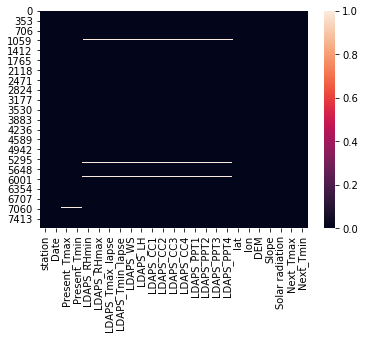

In [254]:
sn.heatmap(df.isnull())

Black color shows the '0' value here, it means that none of the value is empty(Null Values), whereas the white lines shows the presence of the null values in our dataset.

In order to get more clearity we have taken out the sum of the total Null Values down which is also showing there are null valuess present in various features.

In [255]:
df.isnull().sum()

station              2
Date                 2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

Almost each and every feature contains the missing values which needs to be treated.

In [256]:
# Extracintg Year, Month and Day from Date of Journey column:
df['Day'] = pd.DatetimeIndex(df['Date']).day
df['Month']=pd.DatetimeIndex(df['Date']).month
df['Year']=pd.DatetimeIndex(df['Date']).year

In [257]:
#Dropping the Date column as we have extracted date,month and year in seperate columns
df.drop('Date',axis=1,inplace=True)

In [258]:
df.dtypes

station             float64
Present_Tmax        float64
Present_Tmin        float64
LDAPS_RHmin         float64
LDAPS_RHmax         float64
LDAPS_Tmax_lapse    float64
LDAPS_Tmin_lapse    float64
LDAPS_WS            float64
LDAPS_LH            float64
LDAPS_CC1           float64
LDAPS_CC2           float64
LDAPS_CC3           float64
LDAPS_CC4           float64
LDAPS_PPT1          float64
LDAPS_PPT2          float64
LDAPS_PPT3          float64
LDAPS_PPT4          float64
lat                 float64
lon                 float64
DEM                 float64
Slope               float64
Solar radiation     float64
Next_Tmax           float64
Next_Tmin           float64
Day                 float64
Month               float64
Year                float64
dtype: object

#### Treating missing values by replacing it with mean value

In [259]:
for col in df.columns:
    df[col].fillna(df[col].mean(), inplace=True)

In [260]:
df.isnull().sum()

station             0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            0
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Next_Tmin           0
Day                 0
Month               0
Year                0
dtype: int64

Now we can see that there are no missing values in the dataset.

### Exploratory Data Anaylsis

####  Univariate Anaylsis

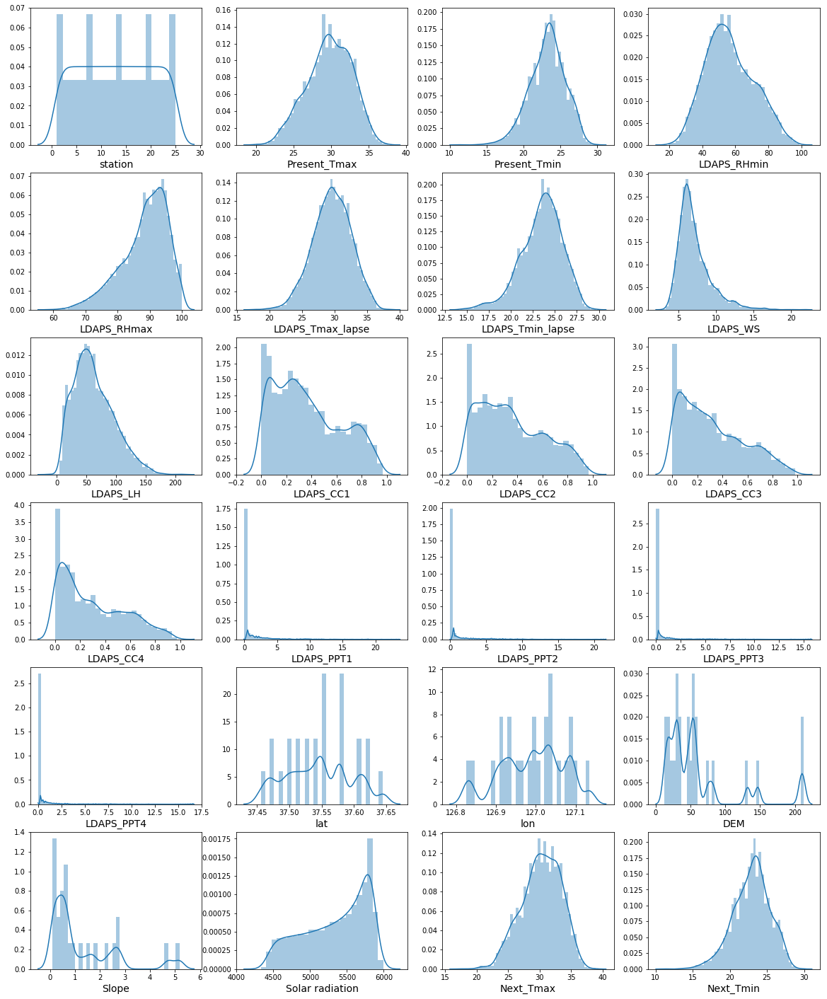

In [261]:
# Plotting distribution plot 
plt.figure(figsize=(20,25),facecolor='white')
plotnumber=1
for column in df:
    if plotnumber<=24:
        ax=plt.subplot(6,4,plotnumber)
        sn.distplot(df[column])
        plt.xlabel(column,fontsize=14)
    plotnumber=plotnumber+1
plt.show()

- There are many outlier in all the features which need to be treated using log or power trnasformation method.
- Columns such as LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4 are showing left skewed distribution.

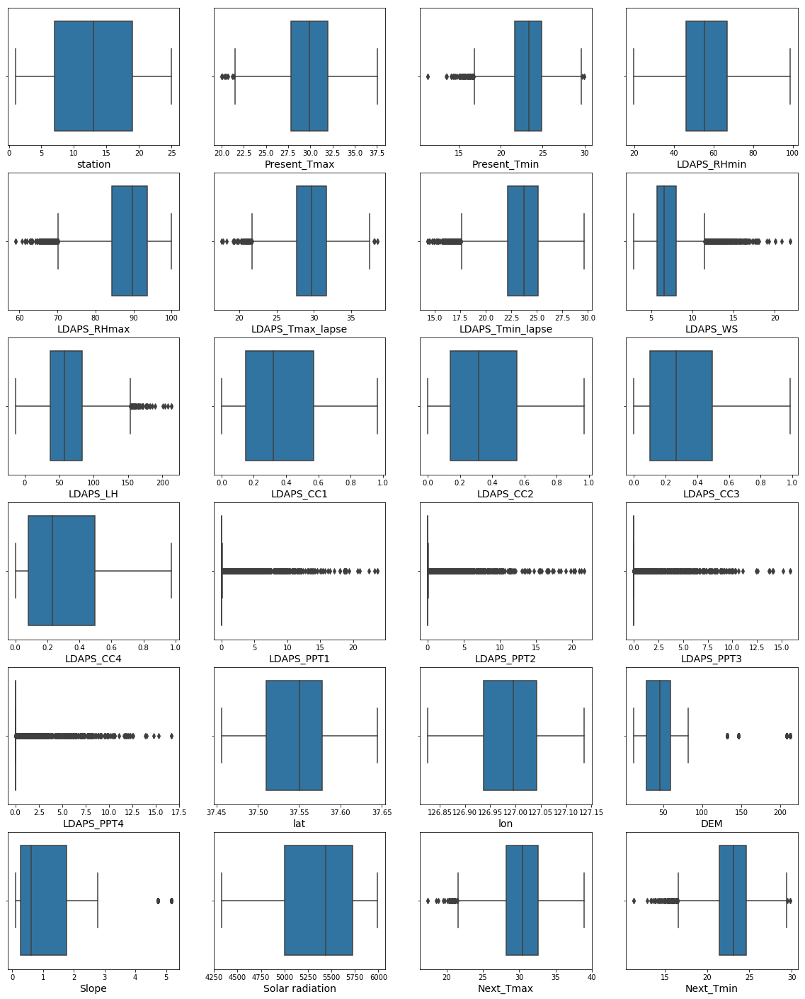

In [262]:
# Plotting box plot 
plt.figure(figsize=(20,25),facecolor='white')
plotnumber=1
for column in df:
    if plotnumber<=24:
        ax=plt.subplot(6,4,plotnumber)
        sn.boxplot(df[column])
        plt.xlabel(column,fontsize=14)
    plotnumber=plotnumber+1
plt.show()

- The above plot shows the number of outliers present in each columns
- Almost all of the columns contain outliers which can be removed using Z_score or Inter_quntile range.
- There are many or very high outliers present in columns such as LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4.

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x00000190A71ED908>,
      dtype=object)

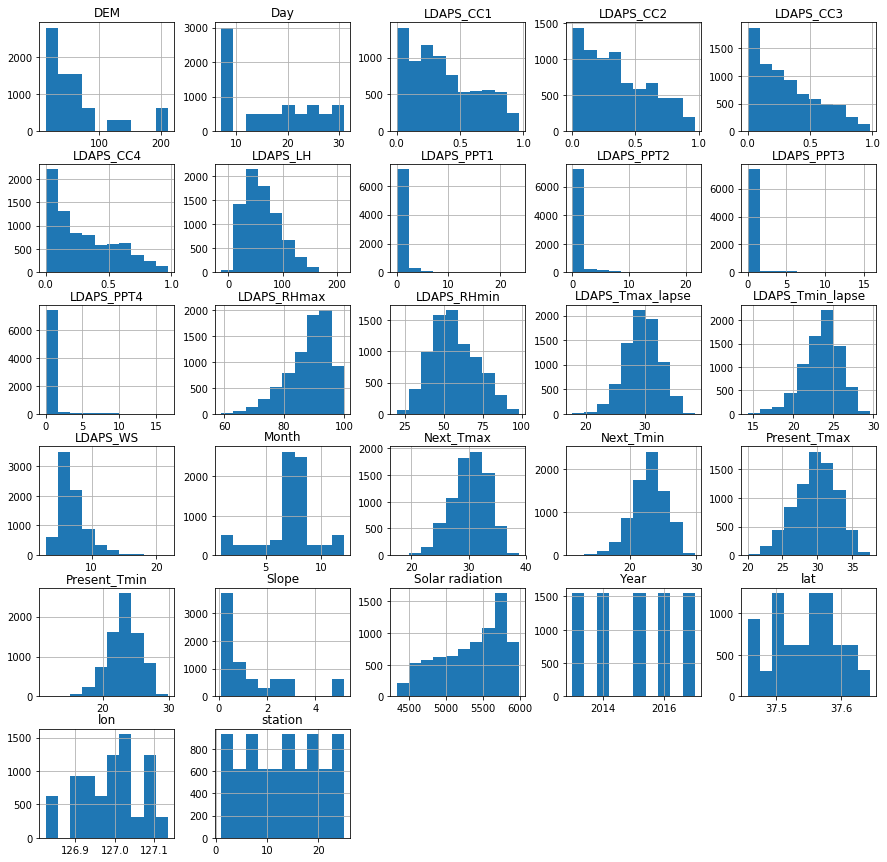

In [294]:
df.hist(figsize=(15,15))

#### Observation

- Solar radiation is raning from 5500 to 6000 having the highest number of instances.
- Present temperatue maximum is highest at 30 where the present temperature minimum is highest at around 24.
- DEM around 70 % of the data show below 50.

#### Bivariate Anaylsis

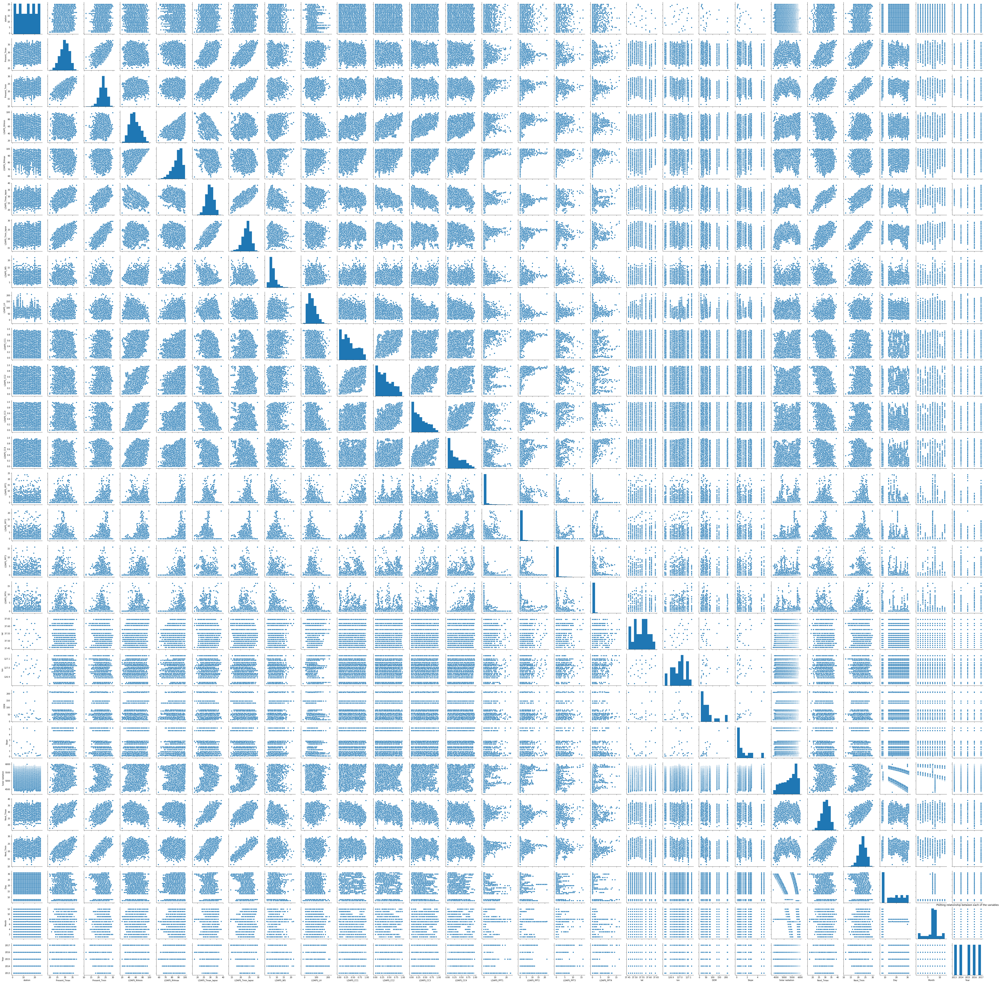

In [296]:
ax = sn.pairplot(df)
plt.title('Plotting relationship between each of the variables')
plt.show()

Through the above and below graph we have come accros to the attributes or the fields which are positively corelated or neutral corelated to each other, Hence we would be taking all of them in to the consideration.

Here we have two columns as targeted variables:

Next_Tmax - Negatively correlated columns: LDAPS_RHmin","LDAPS_CC1","LDAPS_CC2","LDAPS_CC3","LDAPS_CC4","LDAPS_WS","Day"
Next_Tmin - Negatively correlated columns: "LDAPS_PPT4","DEM","Slope","Day","LDAPS_RHmax"

#### Multivariate Anaylsis

In [263]:
#Finding the correlation values
cor=df.corr()
cor

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Day,Month,Year
station,1.000000e+00,0.112655,0.131646,-0.066733,-0.166984,0.069107,0.104758,0.005277,-0.133357,0.006919,...,-2.375015e-01,-1.187044e-01,-2.558297e-01,-9.006090e-02,-0.019001,0.107983,0.128293,-7.467287e-18,9.188159e-18,0.000000e+00
Present_Tmax,1.126554e-01,1.000000,0.618760,-0.204571,-0.301787,0.570129,0.623496,-0.121820,0.135463,-0.311805,...,-5.261489e-02,9.019776e-03,-1.871206e-01,-1.058092e-01,-0.025439,0.610348,0.622741,-1.438070e-01,-1.150750e-03,5.980007e-02
Present_Tmin,1.316462e-01,0.618760,1.000000,0.123143,-0.015140,0.464151,0.762993,-0.034675,-0.009258,0.084447,...,-7.847529e-02,-4.346122e-02,-2.502747e-01,-1.463390e-01,0.053578,0.471806,0.796670,-1.082721e-01,-3.434226e-03,3.739568e-02
LDAPS_RHmin,-6.673316e-02,-0.204571,0.123143,1.000000,0.579141,-0.564580,0.089476,0.294361,-0.070858,0.613818,...,8.709887e-02,-7.623712e-02,1.021149e-01,1.237439e-01,0.244080,-0.437898,0.095019,-6.583711e-02,-5.394021e-02,-2.044507e-03
LDAPS_RHmax,-1.669845e-01,-0.301787,-0.015140,0.579141,1.000000,-0.373404,-0.114143,0.135333,0.238579,0.436652,...,1.957977e-01,2.566694e-02,1.771681e-01,2.195989e-01,0.149261,-0.283738,-0.071997,-1.300684e-02,-3.998985e-02,-1.418320e-01
LDAPS_Tmax_lapse,6.910718e-02,0.570129,0.464151,-0.564580,-0.373404,1.000000,0.654021,-0.311996,0.048010,-0.438439,...,-4.209291e-02,9.066575e-02,-1.788954e-01,-1.623324e-01,0.047971,0.827189,0.586868,-1.603214e-01,-2.168992e-02,1.617217e-02
LDAPS_Tmin_lapse,1.047582e-01,0.623496,0.762993,0.089476,-0.114143,0.654021,1.000000,-0.130035,-0.134761,0.010901,...,-9.625683e-02,-2.670103e-02,-1.954553e-01,-1.858487e-01,0.159975,0.586983,0.880176,-1.779545e-01,-2.749581e-02,-4.693413e-03
LDAPS_WS,5.277000e-03,-0.121820,-0.034675,0.294361,0.135333,-0.311996,-0.130035,1.000000,0.006711,0.289445,...,3.665702e-02,-5.946615e-02,1.910530e-01,1.716286e-01,0.121759,-0.342729,-0.096576,-2.913467e-02,-8.128770e-02,-1.113577e-01
LDAPS_LH,-1.333566e-01,0.135463,-0.009258,-0.070858,0.238579,0.048010,-0.134761,0.006711,1.000000,-0.147296,...,1.332208e-01,2.582205e-02,5.513344e-02,8.678088e-02,-0.047384,0.157616,-0.055440,-1.209485e-02,-2.274775e-02,5.707733e-02
LDAPS_CC1,6.918787e-03,-0.311805,0.084447,0.613818,0.436652,-0.438439,0.010901,0.289445,-0.147296,1.000000,...,-8.130615e-03,-6.842827e-03,-1.409033e-02,-2.075199e-02,0.218309,-0.452541,-0.011028,-2.013716e-02,-7.627189e-02,-6.647797e-02


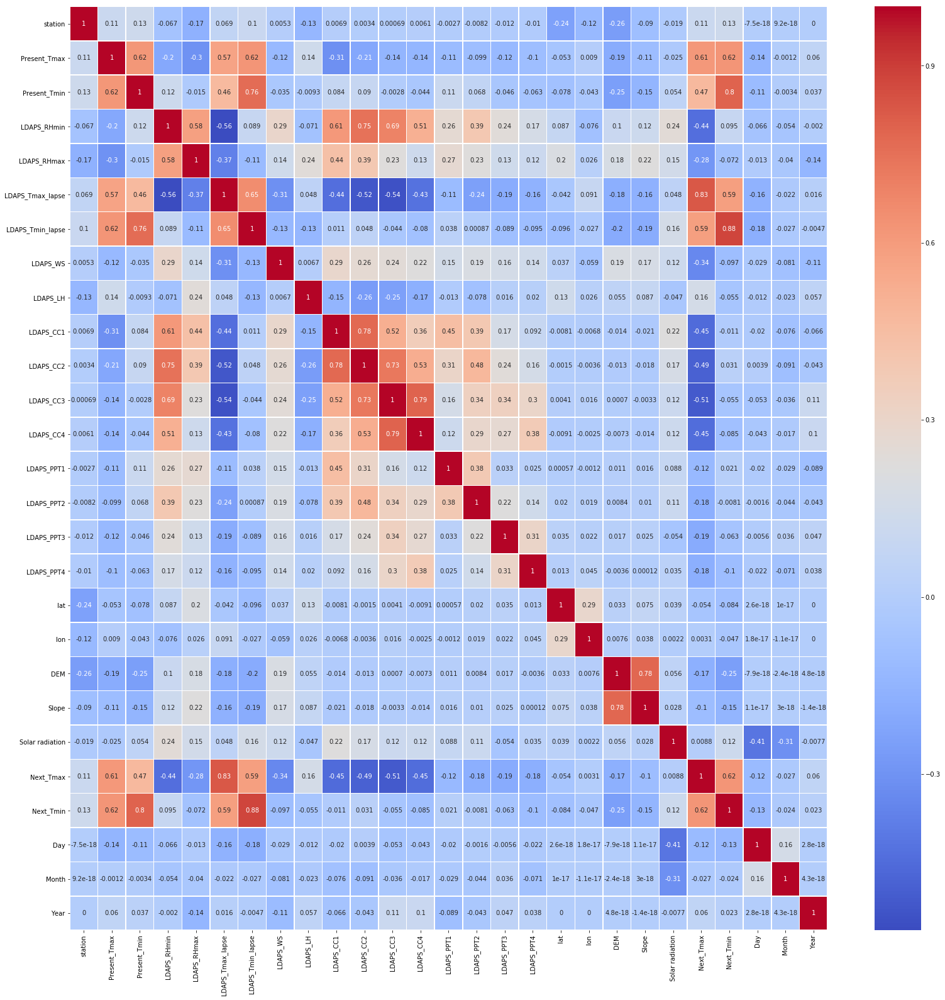

In [264]:
#Plotting heatmap
corr_matrix=df.corr()
fig, axis = plt.subplots(figsize=(27, 27))
sn.heatmap(corr_matrix,annot=True,linewidths=.5,cmap='coolwarm')

In [265]:
# Checking the correalation values in descending order
cor['Next_Tmax'].sort_values(ascending=False)

Next_Tmax           1.000000
LDAPS_Tmax_lapse    0.827189
Next_Tmin           0.621427
Present_Tmax        0.610348
LDAPS_Tmin_lapse    0.586983
Present_Tmin        0.471806
LDAPS_LH            0.157616
station             0.107983
Year                0.059995
Solar radiation     0.008795
lon                 0.003052
Month              -0.026822
lat                -0.053510
Slope              -0.102725
Day                -0.116716
LDAPS_PPT1         -0.118817
DEM                -0.172538
LDAPS_PPT2         -0.178383
LDAPS_PPT4         -0.178718
LDAPS_PPT3         -0.194143
LDAPS_RHmax        -0.283738
LDAPS_WS           -0.342729
LDAPS_RHmin        -0.437898
LDAPS_CC4          -0.446319
LDAPS_CC1          -0.452541
LDAPS_CC2          -0.490756
LDAPS_CC3          -0.514680
Name: Next_Tmax, dtype: float64

Here we have two columns as targeted variables:

Next_Tmax - Removing negatively correlated columns: LDAPS_RHmin","LDAPS_CC1","LDAPS_CC2","LDAPS_CC3","LDAPS_CC4","LDAPS_WS","Day"
Next_Tmin - Removing negatively correlated columns: "LDAPS_PPT4","DEM","Slope","Day","LDAPS_RHmax"

### Removing the Outliers

In [266]:
# Removing the outliers of the data using Z_Score method
from scipy.stats import zscore
z=np.abs(zscore(df))
new_df=df[(z<3).all(axis=1)]

In [267]:
new_df.shape

(6894, 27)

In [268]:
df.shape

(7752, 27)

In [269]:
# Data loss percentage
Data_loss=(df.shape[0]-new_df.shape[0])/df.shape[0]*100
Data_loss

11.06811145510836

After removing the outliers from the data the shape of the data has change from (7752,27) to (6894,27) which shows that with the z score method we are able to remove various rows with lossing about 11 percent of data , Hence our new data shape is (6894,27).

### Checking  the Skewness

In [270]:
new_df.skew()

station             0.002792
Present_Tmax       -0.272653
Present_Tmin       -0.225479
LDAPS_RHmin         0.305740
LDAPS_RHmax        -0.688257
LDAPS_Tmax_lapse   -0.109372
LDAPS_Tmin_lapse   -0.382667
LDAPS_WS            1.087781
LDAPS_LH            0.568781
LDAPS_CC1           0.593990
LDAPS_CC2           0.500911
LDAPS_CC3           0.700217
LDAPS_CC4           0.710930
LDAPS_PPT1          3.731226
LDAPS_PPT2          4.843672
LDAPS_PPT3          5.482625
LDAPS_PPT4          5.927822
lat                 0.108251
lon                -0.275508
DEM                 1.764031
Slope               1.593600
Solar radiation    -0.505353
Next_Tmax          -0.270084
Next_Tmin          -0.237767
Day                 0.255263
Month              -0.683578
Year                0.010998
dtype: float64

In [271]:
#Using log transfomration for Treatment for the skewed data:
for col in new_df.columns:
    if new_df.skew().loc[col]>0.55:
        new_df[col]=np.log1p(new_df[col])

In [272]:
new_df.skew()

station             0.002792
Present_Tmax       -0.272653
Present_Tmin       -0.225479
LDAPS_RHmin         0.305740
LDAPS_RHmax        -0.688257
LDAPS_Tmax_lapse   -0.109372
LDAPS_Tmin_lapse   -0.382667
LDAPS_WS            0.469817
LDAPS_LH           -0.629683
LDAPS_CC1           0.324684
LDAPS_CC2           0.500911
LDAPS_CC3           0.435205
LDAPS_CC4           0.492761
LDAPS_PPT1          2.708722
LDAPS_PPT2          3.575349
LDAPS_PPT3          4.164393
LDAPS_PPT4          4.554634
lat                 0.108251
lon                -0.275508
DEM                 0.450772
Slope               0.847859
Solar radiation    -0.505353
Next_Tmax          -0.270084
Next_Tmin          -0.237767
Day                 0.255263
Month              -0.683578
Year                0.010998
dtype: float64

In [273]:
new_df.isnull().sum()

station             0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            1
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Next_Tmin           0
Day                 0
Month               0
Year                0
dtype: int64

After applying skewness we have 1 missing values in LDAPS_LH which need to be treated using mode method.

In [274]:
new_df["LDAPS_LH"] = new_df["LDAPS_LH"].fillna(new_df["LDAPS_LH"].mode().values[0])

In [275]:
#Storing the data into df_max dataframe
df_max=pd.DataFrame(data=new_df)
df_max.head(10)

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Day,Month,Year
0,1.0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,2.056542,4.254929,0.210218,...,37.6046,126.991,5.362864,1.331046,5992.895996,29.1,21.2,30.0,6.0,2013.0
1,2.0,31.9,21.6,52.263397,90.604721,29.850689,24.035009,1.900896,3.969111,0.203356,...,37.6046,127.032,3.823463,0.414821,5869.312500,30.5,22.5,30.0,6.0,2013.0
2,3.0,31.6,23.3,48.690479,83.973587,30.091292,24.565633,1.965464,3.071445,0.190078,...,37.5776,127.058,3.535344,0.235941,5863.555664,31.1,23.9,30.0,6.0,2013.0
3,4.0,32.0,23.4,58.239788,96.483688,29.704629,23.326177,1.894624,4.200612,0.195873,...,37.6450,127.022,3.844087,1.262657,5856.964844,31.7,24.3,30.0,6.0,2013.0
4,5.0,31.4,21.9,56.174095,90.155128,29.113934,23.486480,1.907318,4.691032,0.140985,...,37.5507,127.135,3.584574,0.409125,5859.552246,31.2,22.5,30.0,6.0,2013.0
5,6.0,31.9,23.5,52.437126,85.307251,29.219342,23.822613,1.971619,3.936352,0.169978,...,37.5102,127.042,4.018874,0.136016,5873.780762,31.5,24.0,30.0,6.0,2013.0
6,7.0,31.4,24.4,56.287189,81.019760,28.551859,24.238467,1.885118,4.837155,0.329016,...,37.5776,126.838,2.593013,0.093946,5849.233398,30.9,23.4,30.0,6.0,2013.0
7,8.0,32.1,23.6,52.326218,78.004539,28.851982,23.819054,1.960717,3.761469,0.305907,...,37.4697,126.910,3.980018,0.941139,5863.992188,31.1,22.9,30.0,6.0,2013.0
8,9.0,31.4,22.0,55.338791,80.784607,28.426975,23.332373,1.948355,4.455637,0.342714,...,37.4967,126.826,3.949920,0.345361,5876.901367,31.3,21.6,30.0,6.0,2013.0
9,10.0,31.6,20.5,56.651203,86.849632,27.576705,22.527018,2.017412,4.158978,0.298839,...,37.4562,126.955,5.344757,1.821027,5893.608398,30.5,21.0,30.0,6.0,2013.0


In [276]:
df_max.shape

(6894, 27)

In [277]:
df_min=pd.DataFrame(data=new_df)
df_min.head(10)

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Day,Month,Year
0,1.0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,2.056542,4.254929,0.210218,...,37.6046,126.991,5.362864,1.331046,5992.895996,29.1,21.2,30.0,6.0,2013.0
1,2.0,31.9,21.6,52.263397,90.604721,29.850689,24.035009,1.900896,3.969111,0.203356,...,37.6046,127.032,3.823463,0.414821,5869.312500,30.5,22.5,30.0,6.0,2013.0
2,3.0,31.6,23.3,48.690479,83.973587,30.091292,24.565633,1.965464,3.071445,0.190078,...,37.5776,127.058,3.535344,0.235941,5863.555664,31.1,23.9,30.0,6.0,2013.0
3,4.0,32.0,23.4,58.239788,96.483688,29.704629,23.326177,1.894624,4.200612,0.195873,...,37.6450,127.022,3.844087,1.262657,5856.964844,31.7,24.3,30.0,6.0,2013.0
4,5.0,31.4,21.9,56.174095,90.155128,29.113934,23.486480,1.907318,4.691032,0.140985,...,37.5507,127.135,3.584574,0.409125,5859.552246,31.2,22.5,30.0,6.0,2013.0
5,6.0,31.9,23.5,52.437126,85.307251,29.219342,23.822613,1.971619,3.936352,0.169978,...,37.5102,127.042,4.018874,0.136016,5873.780762,31.5,24.0,30.0,6.0,2013.0
6,7.0,31.4,24.4,56.287189,81.019760,28.551859,24.238467,1.885118,4.837155,0.329016,...,37.5776,126.838,2.593013,0.093946,5849.233398,30.9,23.4,30.0,6.0,2013.0
7,8.0,32.1,23.6,52.326218,78.004539,28.851982,23.819054,1.960717,3.761469,0.305907,...,37.4697,126.910,3.980018,0.941139,5863.992188,31.1,22.9,30.0,6.0,2013.0
8,9.0,31.4,22.0,55.338791,80.784607,28.426975,23.332373,1.948355,4.455637,0.342714,...,37.4967,126.826,3.949920,0.345361,5876.901367,31.3,21.6,30.0,6.0,2013.0
9,10.0,31.6,20.5,56.651203,86.849632,27.576705,22.527018,2.017412,4.158978,0.298839,...,37.4562,126.955,5.344757,1.821027,5893.608398,30.5,21.0,30.0,6.0,2013.0


In [278]:
# Dropping columns which are not correlating with target variable:
df_max.drop("LDAPS_RHmin", axis=1,inplace=True)
df_max.drop("LDAPS_CC1", axis=1,inplace=True)
df_max.drop("LDAPS_CC2", axis=1,inplace=True)
df_max.drop("LDAPS_CC3", axis=1,inplace=True)
df_max.drop("LDAPS_CC4", axis=1,inplace=True)
df_max.drop("LDAPS_WS", axis=1,inplace=True)
df_max.drop("Day", axis=1,inplace=True)
df_max.head(1)

,station,Present_Tmax,Present_Tmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_LH,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Month,Year
0,1.0,28.7,21.4,91.116364,28.074101,23.006936,4.254929,0.0,0.0,0.0,0.0,37.6046,126.991,5.362864,1.331046,5992.895996,29.1,21.2,6.0,2013.0


### Seperating the data into independent and dependent variables

#### Predicting target variable Next_Tmax

In [279]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
x = df_max.drop(['Next_Tmax'], axis = 1)
y = new_df['Next_Tmax']

In [280]:
print(x.shape)
x.head()

(6894, 19)


,station,Present_Tmax,Present_Tmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_LH,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmin,Month,Year
0,1.0,28.7,21.4,91.116364,28.074101,23.006936,4.254929,0.0,0.0,0.0,0.0,37.6046,126.991,5.362864,1.331046,5992.895996,21.2,6.0,2013.0
1,2.0,31.9,21.6,90.604721,29.850689,24.035009,3.969111,0.0,0.0,0.0,0.0,37.6046,127.032,3.823463,0.414821,5869.312500,22.5,6.0,2013.0
2,3.0,31.6,23.3,83.973587,30.091292,24.565633,3.071445,0.0,0.0,0.0,0.0,37.5776,127.058,3.535344,0.235941,5863.555664,23.9,6.0,2013.0
3,4.0,32.0,23.4,96.483688,29.704629,23.326177,4.200612,0.0,0.0,0.0,0.0,37.6450,127.022,3.844087,1.262657,5856.964844,24.3,6.0,2013.0
4,5.0,31.4,21.9,90.155128,29.113934,23.486480,4.691032,0.0,0.0,0.0,0.0,37.5507,127.135,3.584574,0.409125,5859.552246,22.5,6.0,2013.0


In [281]:
print(y.shape)
y.head()

(6894,)


0    29.1
1    30.5
2    31.1
3    31.7
4    31.2
Name: Next_Tmax, dtype: float64

### Applying Standard Scaler method

In [282]:
#To bring all values to the same scale
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
x = sc.fit_transform(x)

### Finding the best random state

In [283]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
MaxAccu=0
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.3,random_state=i)
    mod=LinearRegression()
    mod.fit(x_train,y_train)
    pred=mod.predict(x_test)
    acc=r2_score(y_test,pred)
    if acc>MaxAccu:
        MaxAccu=acc
        maxRS=i
print("Best R2_score is",MaxAccu,'on random state',maxRS)

Best R2_score is 0.7580855645092056 on random state 178


### Create train test split

In [284]:
# Splitting the dataset into trianing and testing data
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.3,random_state=maxRS)

#### Linear Regression

In [285]:
#Linear Regression
from sklearn.linear_model import LinearRegression
regressor=LinearRegression()
regressor.fit(x_train,y_train)
y_pred=regressor.predict(x_test)
lr_score=r2_score(y_test,y_pred)
print("R2 score from Linear regression is",lr_score)
lr_cv=cross_val_score(regressor,x,y,scoring='r2',cv=5).mean()
lr_mae=mean_absolute_error(y_test,y_pred)
print('Mean absolute error : ',lr_mae)
lr_mse=mean_squared_error(y_test,y_pred)
print('Mean Squared error :',lr_mse)
print("Cross validation score is ",lr_cv)

R2 score from Linear regression is 0.7580855645092056
Mean absolute error :  1.124921727209457
Mean Squared error : 2.1022808571022336
Cross validation score is  0.661891165008984


####  K neighbors regressor

In [287]:
# K nearest neighbors
from sklearn.neighbors import KNeighborsRegressor
neigh = KNeighborsRegressor()
neigh.fit(x, y)
y_pred=neigh.predict(x_test)
knn_score=r2_score(y_test,y_pred)
print("R2 score from K Nearest Neighbors regression is",knn_score)
knn_cv=cross_val_score(neigh,x,y,scoring='r2',cv=5).mean()
knn_mae=mean_absolute_error(y_test,y_pred)
print('Mean absolute error : ',knn_mae)
knn_mse=mean_squared_error(y_test,y_pred)
print('Mean Squared error :',knn_mse)
print("Cross validation score is ",knn_cv)

R2 score from K Nearest Neighbors regression is 0.8532791734100735
Mean absolute error :  0.8544949031863494
Mean Squared error : 1.2750309193101306
Cross validation score is  0.4555623906916383


#### Random Forest Regressor

In [288]:
from sklearn.ensemble import RandomForestRegressor
RFR= RandomForestRegressor(n_estimators=10)
RFR.fit(x_train, y_train)
y_pred=RFR.predict(x_test)
rfr_score=r2_score(y_test,y_pred)
print("R2 score from Random Forest regression is",rfr_score)
rfr_cv=cross_val_score(RFR,x,y,scoring='r2',cv=5).mean()
rfr_mae=mean_absolute_error(y_test,y_pred)
print('Mean absolute error : ',rfr_mae)
rfr_mse=mean_squared_error(y_test,y_pred)
print('Mean Squared error :',rfr_mse)
print("Cross validation score is ",rfr_cv)

R2 score from Random Forest regression is 0.850322907316149
Mean absolute error :  0.8606089898501691
Mean Squared error : 1.300721414402534
Cross validation score is  0.6437667973818055


#### Gradient Boosting Regressor

In [289]:
### using gradient boosting classifier
from sklearn.ensemble import GradientBoostingRegressor
clf=GradientBoostingRegressor()
clf.fit(x_train, y_train)
pred=clf.predict(x_test)
gbc_acc=r2_score(y_test,pred)
print('R2 score using gradient boosting classifier model is',gbc_acc*100)
gbc_cv=cross_val_score(clf,x,y,cv=5).mean()
gbc_mae=mean_absolute_error(y_test,y_pred)
print('Mean absolute error : ',gbc_mae)
gbc_mse=mean_squared_error(y_test,y_pred)
print('Mean Squared error :',gbc_mse)
print("Cross validation score",gbc_cv*100)

R2 score using gradient boosting classifier model is 83.93385485190305
Mean absolute error :  0.8606089898501691
Mean Squared error : 1.300721414402534
Cross validation score 66.88788755161707


In [293]:
model=['Linear Regression','K Neighbors Regressor','Random Forest Regressor','Gradient Boosting Regressor']

acc=[lr_score*100,knn_score*100,rfr_score*100,gbc_acc*100]
mae=[lr_mae,knn_mae,rfr_mae,gbc_mae]
mse=[lr_mse,knn_mse,rfr_mse,gbc_mse]
cv_score=[lr_cv*100,knn_cv*100,rfr_cv*100,gbc_cv*100]

result=pd.DataFrame({'Model':model,'R2_score':acc,'Mean Absolute Error':mae,'Mean Squared Error':mse,'Cross validation_score':cv_score})
result
# Creting dataframe to store R2_score,Mae and cv score of all the models.

,Model,R2_score,Mean Absolute Error,Mean Squared Error,Cross validation_score
0,Linear Regression,75.808556,1.124922,2.102281,66.189117
1,K Neighbors Regressor,85.327917,0.854495,1.275031,45.556239
2,Random Forest Regressor,85.032291,0.860609,1.300721,64.376680
3,Gradient Boosting Regressor,83.933855,0.860609,1.300721,66.887888


### Applying hyperparameter tuning to best model

In [199]:
from sklearn.model_selection import GridSearchCV

In [200]:
parameters = { 
            "n_estimators"      : [100,200,500],
            "max_features"      : ["auto", "sqrt", "log2"],
            "min_samples_split" : [2,4,8],
            "bootstrap": [True, False],
            }

In [201]:
GCV=GridSearchCV(RandomForestRegressor(),parameters,cv=5)

In [202]:
GCV.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=RandomForestRegressor(),
             param_grid={'bootstrap': [True, False],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'min_samples_split': [2, 4, 8],
                         'n_estimators': [100, 200, 500]})

In [203]:
GCV.best_params_

{'bootstrap': False,
 'max_features': 'log2',
 'min_samples_split': 2,
 'n_estimators': 500}

In [207]:
Final_Model=RandomForestRegressor(bootstrap=False,max_features='log2',min_samples_split=2,n_estimators=500)
Final_Model.fit(x_train,y_train)
y_pred=Final_Model.predict(x_test)
score=Final_Model.score(x_train,y_train)
print("Accuracy Score of the model is ",score*100)
acc=r2_score(y_test,y_pred)
print("R2 Score of the model is ",acc*100)
rfc_mae=mean_absolute_error(y_test,y_pred)
print('Mean absolute error : ',rfc_mae)

Accuracy Score of the model is  99.99999985552446
R2 Score of the model is  89.26851637054834
Mean absolute error :  0.7155651984214513


### Choosing the model

I am going to choose Random Forest Regressor model,as it is predicting the accuracy score of 99.00% where as where the R2_score also shows almost 89% which is grater than any other model which have been tested above.

### Saving the model

In [208]:
import joblib
import sys
sys.modules['sklearn.externals.joblib']=joblib
from sklearn.externals import joblib

In [209]:
joblib.dump(Final_Model,'Final_Model.pkl')

['Final_Model.pkl']

### 2.Predcting next target variable Next_Tmin

In [210]:
df_min.head()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Day,Month,Year
0,1.0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,2.056542,4.254929,0.210218,...,37.6046,126.991,5.362864,1.331046,5992.895996,29.1,21.2,30.0,6.0,2013.0
1,2.0,31.9,21.6,52.263397,90.604721,29.850689,24.035009,1.900896,3.969111,0.203356,...,37.6046,127.032,3.823463,0.414821,5869.312500,30.5,22.5,30.0,6.0,2013.0
2,3.0,31.6,23.3,48.690479,83.973587,30.091292,24.565633,1.965464,3.071445,0.190078,...,37.5776,127.058,3.535344,0.235941,5863.555664,31.1,23.9,30.0,6.0,2013.0
3,4.0,32.0,23.4,58.239788,96.483688,29.704629,23.326177,1.894624,4.200612,0.195873,...,37.6450,127.022,3.844087,1.262657,5856.964844,31.7,24.3,30.0,6.0,2013.0
4,5.0,31.4,21.9,56.174095,90.155128,29.113934,23.486480,1.907318,4.691032,0.140985,...,37.5507,127.135,3.584574,0.409125,5859.552246,31.2,22.5,30.0,6.0,2013.0


In [211]:
# Dropping columns which are not correlating with target variable:
df_min.drop("LDAPS_PPT4", axis=1,inplace=True)
df_min.drop("DEM", axis=1,inplace=True)
df_min.drop("Slope", axis=1,inplace=True)
df_min.drop("Day", axis=1,inplace=True)
df_min.drop("LDAPS_RHmax", axis=1,inplace=True)
df_min.head(1)

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,...,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,lat,lon,Solar radiation,Next_Tmax,Next_Tmin,Month,Year
0,1.0,28.7,21.4,58.255688,28.074101,23.006936,2.056542,4.254929,0.210218,0.203896,...,0.0,0.0,0.0,37.6046,126.991,5992.895996,29.1,21.2,6.0,2013.0


### Seperating the data into independent and dependent variables

In [212]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
x = df_max.drop(['Next_Tmin'], axis = 1)
y = new_df['Next_Tmin']

In [213]:
print(x.shape)
x.head()

(6894, 19)


,station,Present_Tmax,Present_Tmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_LH,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Month,Year
0,1.0,28.7,21.4,91.116364,28.074101,23.006936,4.254929,0.0,0.0,0.0,0.0,37.6046,126.991,5.362864,1.331046,5992.895996,29.1,6.0,2013.0
1,2.0,31.9,21.6,90.604721,29.850689,24.035009,3.969111,0.0,0.0,0.0,0.0,37.6046,127.032,3.823463,0.414821,5869.312500,30.5,6.0,2013.0
2,3.0,31.6,23.3,83.973587,30.091292,24.565633,3.071445,0.0,0.0,0.0,0.0,37.5776,127.058,3.535344,0.235941,5863.555664,31.1,6.0,2013.0
3,4.0,32.0,23.4,96.483688,29.704629,23.326177,4.200612,0.0,0.0,0.0,0.0,37.6450,127.022,3.844087,1.262657,5856.964844,31.7,6.0,2013.0
4,5.0,31.4,21.9,90.155128,29.113934,23.486480,4.691032,0.0,0.0,0.0,0.0,37.5507,127.135,3.584574,0.409125,5859.552246,31.2,6.0,2013.0


In [214]:
print(y.shape)
y.head()

(6894,)


0    21.2
1    22.5
2    23.9
3    24.3
4    22.5
Name: Next_Tmin, dtype: float64

### Applying Standard Scaler method

In [215]:
#To bring all values to the same scale
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
x = sc.fit_transform(x)

### Finding the best random state

In [216]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
MaxAccu=0
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.3,random_state=i)
    mod=LinearRegression()
    mod.fit(x_train,y_train)
    pred=mod.predict(x_test)
    acc=r2_score(y_test,pred)
    if acc>MaxAccu:
        MaxAccu=acc
        maxRS=i
print("Best R2_score is",MaxAccu,'on random state',maxRS)

Best R2_score is 0.8416806373887717 on random state 116


### Create train test split

In [217]:
# Splitting the dataset into trianing and testing data
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.3,random_state=maxRS)

#### Linear Regression

In [218]:
#Linear Regression
from sklearn.linear_model import LinearRegression
regressor=LinearRegression()
regressor.fit(x_train,y_train)
y_pred=regressor.predict(x_test)
lr_score=r2_score(y_test,y_pred)
print("R2 score from Linear regression is",lr_score)
lr_cv=cross_val_score(regressor,x,y,scoring='r2',cv=5).mean()
lr_mae=mean_absolute_error(y_test,y_pred)
print('Mean absolute error : ',lr_mae)
lr_mse=mean_squared_error(y_test,y_pred)
print('Mean Squared error :',lr_mse)
print("Cross validation score is ",lr_cv)

R2 score from Linear regression is 0.8416806373887717
Mean absolute error :  0.7503094337702607
Mean Squared error : 0.9439219172676884
Cross validation score is  0.7809569098177545


#### Support Vector Regressor

In [219]:
# Support Vector Regression
from sklearn.svm import SVR
SR = SVR()
SR.fit(x, y)
y_pred=SR.predict(x_test)
svr_score=r2_score(y_test,y_pred)
print("R2 score from Support Vector regression is",svr_score)
svr_cv=cross_val_score(SR,x,y,scoring='r2',cv=5).mean()
svr_mae=mean_absolute_error(y_test,y_pred)
print('Mean absolute error : ',svr_mae)
svr_mse=mean_squared_error(y_test,y_pred)
print('Mean Squared error :',svr_mse)
print("Cross validation score is ",svr_cv)

R2 score from Support Vector regression is 0.9267838747994637
Mean absolute error :  0.4747185906445793
Mean Squared error : 0.4365246558243787
Cross validation score is  0.7220362745668141


#### K neighbors regressor

In [220]:
# K nearest neighbors
from sklearn.neighbors import KNeighborsRegressor
neigh = KNeighborsRegressor()
neigh.fit(x, y)
y_pred=neigh.predict(x_test)
knn_score=r2_score(y_test,y_pred)
print("R2 score from K Nearest Neighbors regression is",knn_score)
knn_cv=cross_val_score(neigh,x,y,scoring='r2',cv=5).mean()
knn_mae=mean_absolute_error(y_test,y_pred)
print('Mean absolute error : ',knn_mae)
knn_mse=mean_squared_error(y_test,y_pred)
print('Mean Squared error :',knn_mse)
print("Cross validation score is ",knn_cv)

R2 score from K Nearest Neighbors regression is 0.9019374642366915
Mean absolute error :  0.5823112633559667
Mean Squared error : 0.584662389003761
Cross validation score is  0.6122620115391749


#### Random Forest Regressor

In [221]:
from sklearn.ensemble import RandomForestRegressor
RFR= RandomForestRegressor(n_estimators=10)
RFR.fit(x_train, y_train)
y_pred=RFR.predict(x_test)
rfr_score=r2_score(y_test,y_pred)
print("R2 score from Random Forest regression is",rfr_score)
rfr_cv=cross_val_score(RFR,x,y,scoring='r2',cv=5).mean()
rfr_mae=mean_absolute_error(y_test,y_pred)
print('Mean absolute error : ',rfr_mae)
rfr_mse=mean_squared_error(y_test,y_pred)
print('Mean Squared error :',rfr_mse)
print("Cross validation score is ",rfr_cv)

R2 score from Random Forest regression is 0.8872854668769481
Mean absolute error :  0.624703884902889
Mean Squared error : 0.6720196219505119
Cross validation score is  0.7627623299206021


#### Gradient Boosting Regressor

In [226]:
### using gradient boosting classifier
from sklearn.ensemble import GradientBoostingRegressor
clf=GradientBoostingRegressor()
clf.fit(x_train, y_train)
pred=clf.predict(x_test)
gbc_acc=r2_score(y_test,pred)
print('R2 score using gradient boosting classifier model is',gbc_acc*100)
gbc_cv=cross_val_score(clf,x,y,cv=5).mean()
gbc_mae=mean_absolute_error(y_test,y_pred)
print('Mean absolute error : ',gbc_mae)
gbc_mse=mean_squared_error(y_test,y_pred)
print('Mean Squared error :',gbc_mse)
print("Cross validation score",gbc_cv*100)

R2 score using gradient boosting classifier model is 88.93258080385432
Mean absolute error :  0.624703884902889
Mean Squared error : 0.6720196219505119
Cross validation score 79.61437867932247


In [228]:
model=['Linear Regression','Support Vector Regressor','K Neighbors Regressor','Random Forest Regressor','Gradient Boosting Regressor']

acc=[lr_score*100,svr_score*100,knn_score*100,rfr_score*100,gbc_acc*100]
mae=[svr_mae,lr_mae,knn_mae,rfr_mae,gbc_mae]
mse=[svr_mse,lr_mse,knn_mse,rfr_mse,gbc_mse]
cv_score=[svr_cv*100,lr_cv*100,knn_cv*100,rfr_cv*100,gbc_cv*100]

result=pd.DataFrame({'Model':model,'R2_score':acc,'Mean Absolute Error':mae,'Mean Squared Error':mse,'Cross validation_score':cv_score})
result
# Creting dataframe to store R2_score,Mae and cv score of all the models.

,Model,R2_score,Mean Absolute Error,Mean Squared Error,Cross validation_score
0,Linear Regression,84.168064,0.474719,0.436525,72.203627
1,Support Vector Regressor,92.678387,0.750309,0.943922,78.095691
2,K Neighbors Regressor,90.193746,0.582311,0.584662,61.226201
3,Random Forest Regressor,88.728547,0.624704,0.672020,76.276233
4,Gradient Boosting Regressor,88.932581,0.624704,0.672020,79.614379


### Choosing the model

In above all the models I am going to choose GradientBoostingRegressor as the best and final model for prediction of the next day minimum temperature.
Gradient Boosting Regressor model, shows the R2_score  almost 89% and cross validation score of 79% which shows least differnce which is better than any other model which have been tested above.

### Applying hyperparameter to the best accuracy model

In [229]:
parameters = {'learning_rate': [0.01,0.02,0.03],
              'subsample'    : [ 0.2, 0.5],
              'n_estimators' : [100,500],
              'max_depth'    : [4,6]}

In [230]:
GCV=GridSearchCV(GradientBoostingRegressor(),parameters,cv=5)

In [232]:
GCV.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=GradientBoostingRegressor(),
             param_grid={'learning_rate': [0.01, 0.02, 0.03],
                         'max_depth': [4, 6], 'n_estimators': [100, 500],
                         'subsample': [0.2, 0.5]})

In [236]:
GCV.best_params_

{'learning_rate': 0.03, 'max_depth': 6, 'n_estimators': 500, 'subsample': 0.5}

In [241]:
Final_Model2=GradientBoostingRegressor(n_estimators= 500,subsample=0.5,learning_rate=0.03,max_depth=6)
Final_Model2.fit(x_train,y_train)
y_pred=Final_Model2.predict(x_test)
score=Final_Model2.score(x_train,y_train)
print("Accuracy Score of the model is ",score*100)
acc=r2_score(y_test,y_pred)
print("R2 Score of the model is ",acc*100)
gbc_mae=mean_absolute_error(y_test,y_pred)
print('Mean absolute error : ',gbc_mae)

Accuracy Score of the model is  98.07160199061695
R2 Score of the model is  92.76257146473922
Mean absolute error :  0.493947736498317


#### With the help of hyperparameter tuning the R2_Score of Gradient Boosting Regressor has increased from 89% t0 92.76 so it is giving best result as compared to other models

### Saving the model

In [242]:
from sklearn.externals import joblib

In [243]:
joblib.dump(Final_Model2,'Final_Model2.pkl')

['Final_Model2.pkl']